In [2]:
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
import seaborn as sns
import pandas as pd 
from collections import Counter
import yaml
from PIL import Image

In [3]:
import shutil
import os

# Define source and destination paths
src_dir = "/kaggle/input/microscopy-cell-segmentation"
dst_dir = "/kaggle/working/"

# Copy dataset to writable directory
shutil.copytree(src_dir, dst_dir, dirs_exist_ok=True)

print("✅ Dataset copied to working directory!")


✅ Dataset copied to working directory!


In [4]:
# Load the YAML file
yaml_path = "/kaggle/input/microscopy-cell-segmentation/data.yaml"  # Update this
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)

# Extract class names
class_names = data_yaml["names"]
num_classes = data_yaml["nc"]

print(f"Number of classes: {num_classes}")
print(f"Class names: {class_names}")


Number of classes: 2
Class names: ['blood_vessel', 'glomerulus']


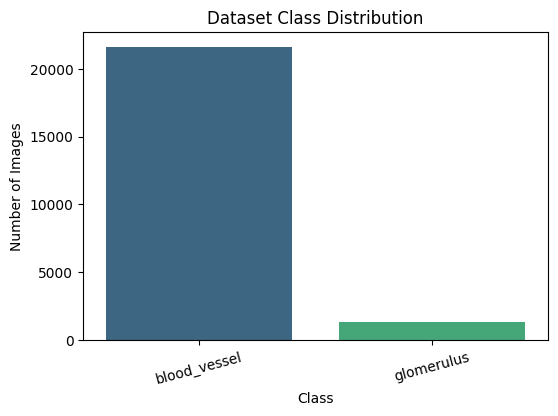

In [5]:
# Define paths
base_path = "/kaggle/input/microscopy-cell-segmentation/train/labels"  # Update this

# Count occurrences of each class in the dataset
class_counts = {name: 0 for name in class_names}

for label_file in os.listdir(base_path):
    with open(os.path.join(base_path, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_idx = int(line.split()[0])  # Get class index
            class_counts[class_names[class_idx]] += 1
class_counts_df = pd.DataFrame(class_counts.items(), columns=["Class", "Count"])

# Plot class distribution
plt.figure(figsize=(6, 4))
sns.barplot(data=class_counts_df, x="Class", y="Count", palette="viridis")
plt.title("Dataset Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.show()



In [6]:
import os
import collections

# Define paths
label_dir = "/kaggle/working/train/labels"

# Count labels per class
class_counts = collections.defaultdict(int)

# Read label files
for label_file in os.listdir(label_dir):
    with open(os.path.join(label_dir, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID (assuming first value in YOLO format)
            class_counts[class_id] += 1

# Print class distribution
print("Class Distribution Before Balancing:")
for class_id, count in sorted(class_counts.items()):
    print(f"Class {class_id}: {count} images")

# Find the target count (max of any class)
target_count = min(class_counts.values())
print(f"\nTarget count for all classes: {target_count}")


Class Distribution Before Balancing:
Class 0: 21624 images
Class 1: 1320 images

Target count for all classes: 1320


In [7]:
import shutil
import random

# Define paths
train_images_dir = "/kaggle/working/train/images"
train_labels_dir = "/kaggle/working/train/labels"

# Target count (smallest class count)
target_count = min(class_counts.values())  # 503 in this case

# Get all class 0 files
class_0_files = []
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            if int(line.split()[0]) == 0:  # Check if it's Class 0
                class_0_files.append(lbl_file)
                break  # Only need to check the first line

# Randomly select Class 0 files to keep
files_to_keep = set(random.sample(class_0_files, target_count))
files_removed = []

# Remove extra files
for lbl_file in class_0_files:
    if lbl_file not in files_to_keep:
        img_file = lbl_file.replace(".txt", ".jpg")

        src_label = os.path.join(train_labels_dir, lbl_file)
        src_image = os.path.join(train_images_dir, img_file)

        # Move to a backup folder instead of deleting (optional)
        backup_dir = "/kaggle/working/removed_samples"
        os.makedirs(backup_dir, exist_ok=True)
        shutil.move(src_label, os.path.join(backup_dir, lbl_file))
        shutil.move(src_image, os.path.join(backup_dir, img_file))

        files_removed.append(lbl_file)

print("\n✅ **Undersampling Completed!**")
print(f"🗑 Removed {len(files_removed)} files from Class 0")



✅ **Undersampling Completed!**
🗑 Removed 2607 files from Class 0


In [8]:
# Recalculate class distribution after undersampling
from collections import Counter
import os

train_labels_dir = "/kaggle/working/train/labels"

final_class_counts = Counter()
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID
            final_class_counts[class_id] += 1

print("\n✅ **Final Class Distribution After Undersampling:**")
for class_id, count in final_class_counts.items():
    print(f"Class {class_id}: {count} images")



✅ **Final Class Distribution After Undersampling:**
Class 0: 7194 images
Class 1: 577 images


In [9]:
import yaml

# Path to data.yaml in the working directory
yaml_path = "/kaggle/working/data.yaml"

# Load the existing YAML file
with open(yaml_path, "r") as file:
    data = yaml.safe_load(file)

# Add/Modify augmentation settings (YOLOv12 supports these augmentations)
data["augment"] = {
    "mosaic": True,
    "mixup": 0.2,
    "hsv_h": 0.015,
    "hsv_s": 0.7,
    "hsv_v": 0.4,
    "perspective": 0.0005,
    "shear": 0.0001,
    "flipud": 0.5,
    "fliplr": 0.5,
    "rotate": 5.0,
    "scale": 0.5
}

# Save the updated YAML file
with open(yaml_path, "w") as file:
    yaml.dump(data, file, default_flow_style=False)

print("✅ `data.yaml` updated successfully with on-the-fly augmentations!")


✅ `data.yaml` updated successfully with on-the-fly augmentations!


✅ Image loaded successfully!


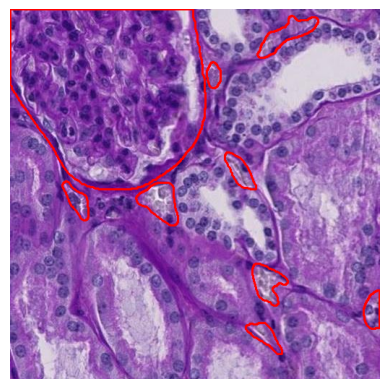

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_path = "/kaggle/working/train/images/0006ff2aa7cd_png.rf.f86bcb9dc6c4cebc4c5f0d84601ccca1.jpg"
label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
# Ensure the image exists before processing
if os.path.exists(img_path):
    img = cv2.imread(img_path)
    
    if img is not None:  # Check if image is successfully read
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        print("✅ Image loaded successfully!")
    else:
        print("⚠️ Error: Image could not be loaded. Possible corruption:", img_path)
else:
    print("❌ Image path does not exist:", img_path)
# Example: Load an image and overlay its polygon annotation


# Read image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Read annotations
with open(label_path, "r") as f:
    lines = f.readlines()

for line in lines:
    values = list(map(float, line.split()))
    class_id = int(values[0])
    polygon = values[1:]  # Polygon coordinates

    # Convert YOLO polygon format to image points
    points = [(int(polygon[i] * img.shape[1]), int(polygon[i+1] * img.shape[0])) for i in range(0, len(polygon), 2)]
    
    # Draw polygon
    cv2.polylines(img, [np.array(points)], isClosed=True, color=(255, 0, 0), thickness=2)

# Show image with annotations
plt.imshow(img)
plt.axis("off")
plt.show()


In [12]:
import yaml

# Define the correct paths for your dataset
data_yaml_path = "/kaggle/working/data.yaml"  # Save in working directory

correct_paths = {
    "train": "/kaggle/working/train/images",  # Update this path
    "val": "/kaggle/working/valid/images",  # Update this path
    "test": "/kaggle/working/test/images",  # Update this path
    "nc": 2,  # Number of classes
    "names": ['blood_vessel', 'glomerulus']  # Class names
}

# Save the updated data.yaml
with open(data_yaml_path, "w") as file:
    yaml.dump(correct_paths, file, default_flow_style=False)

print(f"✅ Updated data.yaml saved at: {data_yaml_path}")


✅ Updated data.yaml saved at: /kaggle/working/data.yaml


In [13]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.7 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.1 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 68.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [21]:
from ultralytics import YOLO
model = YOLO("yolo11l.pt")

In [22]:
import time

# Start time
start_time = time.time()

# Train the model
results = model.train(
   data='/kaggle/working/data.yaml',
   imgsz=128,
   epochs=2,
   batch=16,
   name='yolo12l.pt',
)

# End time
end_time = time.time()

# Calculate total time taken
total_time = end_time - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)

# Display training summary
print(f"✅ Training Completed!")
print(f"🕒 Time Taken: {minutes} min {seconds} sec")
print(f"🔄 Total Epochs: {results.epochs}")


Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=128, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo12l.pt, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1398       9835       0.12      0.258     0.0726     0.0418
          blood_vessel       1231       9423     0.0417     0.0281     0.0117    0.00289
            glomerulus        361        412      0.199      0.488      0.133     0.0807
Speed: 0.0ms preprocess, 1.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/yolo12l.pt
✅ Training Completed!
🕒 Time Taken: 1 min 15 sec


AttributeError: 'DetMetrics' object has no attribute 'epochs'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP).

    Attributes:
        names (dict[int, str]): A dictionary of class names.
        box (Metric): An instance of the Metric class for storing detection results.
        speed (dict[str, float]): A dictionary for storing execution times of different parts of the detection process.
        task (str): The task type, set to 'detect'.
        stats (dict[str, list]): A dictionary containing lists for true positives, confidence scores, predicted classes, target classes, and target images.
        nt_per_class: Number of targets per class.
        nt_per_image: Number of targets per image.

    Methods:
        update_stats: Update statistics by appending new values to existing stat collections.
        process: Process predicted results for object detection and update metrics.
        clear_stats: Clear the stored statistics.
        keys: Return a list of keys for accessing specific metrics.
        mean_results: Calculate mean of detected objects & return precision, recall, mAP50, and mAP50-95.
        class_result: Return the result of evaluating the performance of an object detection model on a specific class.
        maps: Return mean Average Precision (mAP) scores per class.
        fitness: Return the fitness of box object.
        ap_class_index: Return the average precision index per class.
        results_dict: Return dictionary of computed performance metrics and statistics.
        curves: Return a list of curves for accessing specific metrics curves.
        curves_results: Return a list of computed performance metrics and statistics.
        summary: Generate a summarized representation of per-class detection metrics as a list of dictionaries.
    

In [25]:
import shutil

# Define the folder path and output ZIP file
source_folder = "/kaggle/working/runs/detect/yolo11l.pt"  # Folder you want to zip
zip_path = "/kaggle/working/yolo11l.zip"  # Output ZIP file

# Create the ZIP file
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', source_folder)

print(f"✅ ZIP file created: {zip_path}")


✅ ZIP file created: /kaggle/working/yolo11l.zip


In [26]:
from ultralytics import YOLO

# Load your trained YOLOv11 model
model = YOLO("/kaggle/working/runs/detect/yolo11l.pt/weights/best.pt")

# Run validation on the test/valid dataset
metrics = model.val(data="/kaggle/working/data.yaml")

# Print all metrics
print("\n📊 **Full YOLO Model Evaluation Report:**")
print(metrics)


Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l summary (fused): 190 layers, 25,280,854 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1651.3±345.9 MB/s, size: 56.6 KB)
val: Scanning /kaggle/working/valid/labels.cache... 1398 images, 143 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1398/1398 2.6Mit/s 0.0s0s
val: /kaggle/working/valid/images/0bc3e1a729e4_png.rf.49a2bf9eefdbc9eda94e8f45f44d56a9.jpg: 7 duplicate labels removed
val: /kaggle/working/valid/images/0ce440ad7080_png.rf.25350f1702eed8d2dafb08c85dd13bd1.jpg: 13 duplicate labels removed
val: /kaggle/working/valid/images/0f6e1cb07f74_png.rf.73a6a11b69fe3f273ae7fa3d805cbe44.jpg: 8 duplicate labels removed
val: /kaggle/working/valid/images/1b5da995f08e_png.rf.eedba16fe16022854f88e0939d0052e0.jpg: 1 duplicate labels removed
val: /kaggle/working/valid/images/228da07bf8d9_png.rf.a757b536f422f64075542e6dd635017a.jpg: 7 duplicate labels removed
val: /kaggle/wo

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1398       9835       0.12      0.257     0.0715     0.0411
          blood_vessel       1231       9423     0.0396     0.0255     0.0116    0.00289
            glomerulus        361        412      0.201      0.488      0.131     0.0793
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

📊 **Full YOLO Model Evaluation Report:**
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b54c267410>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015, 

<Figure size 1000x600 with 0 Axes>

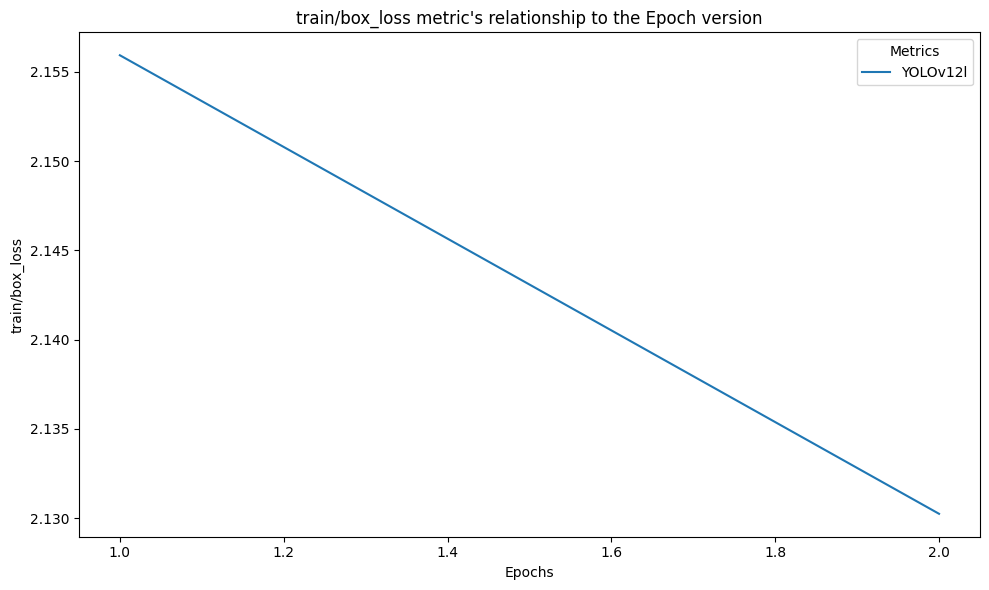

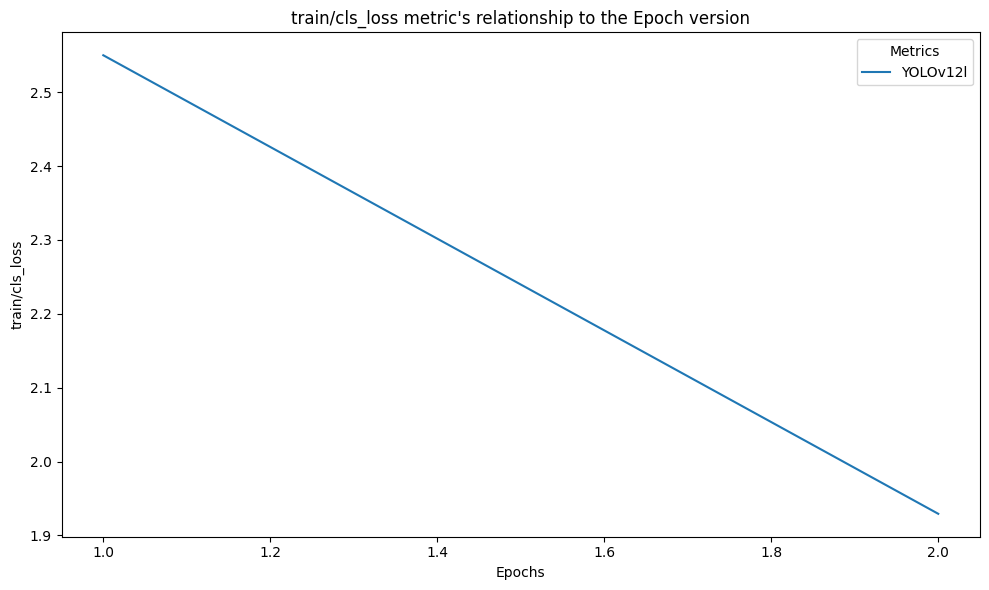

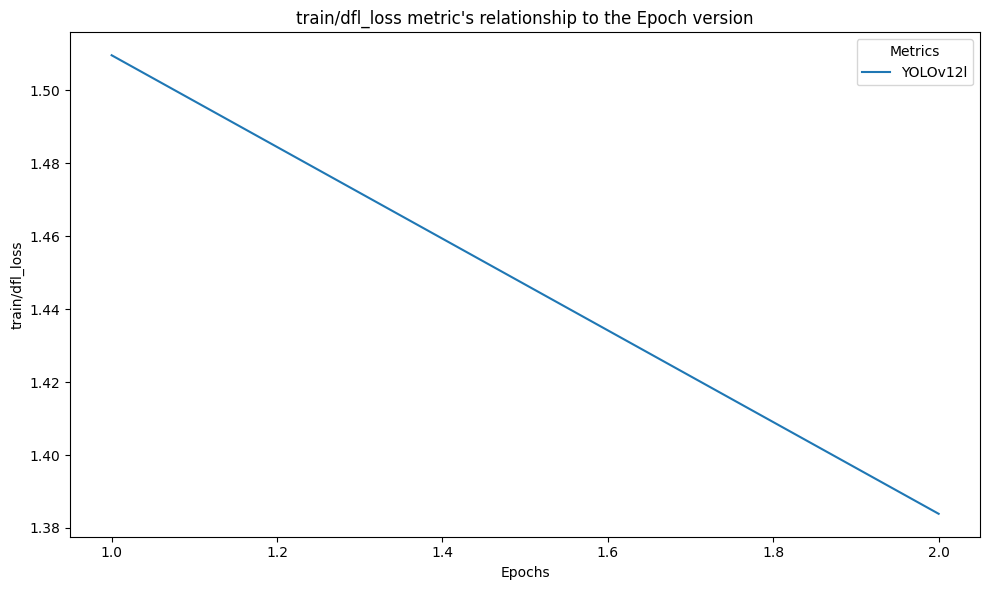

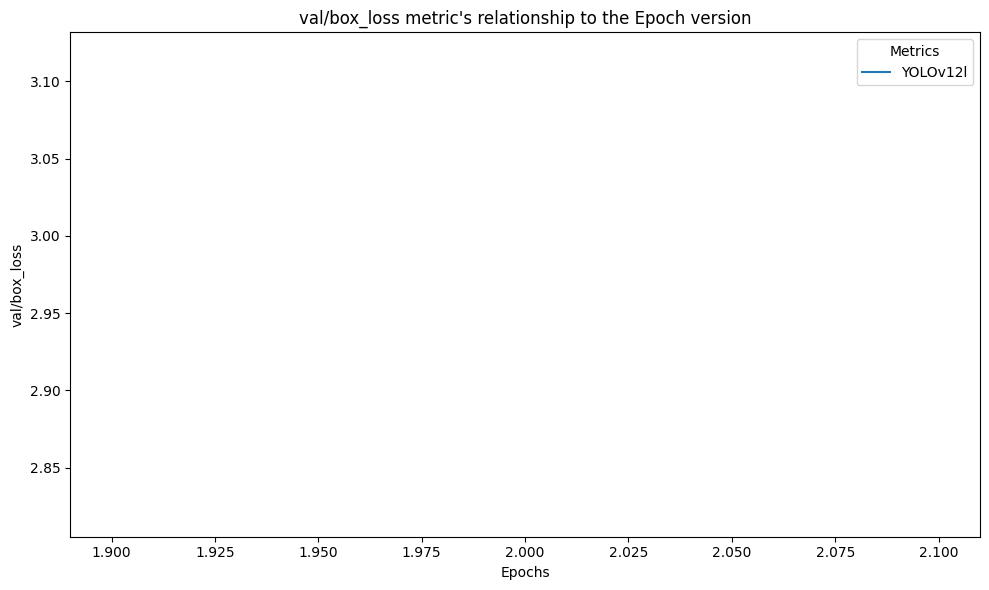

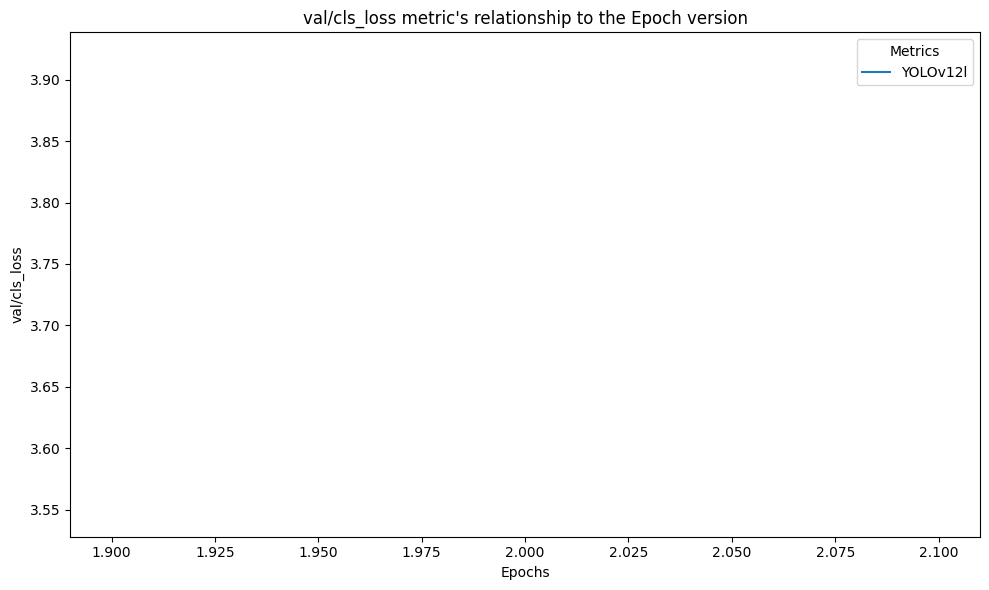

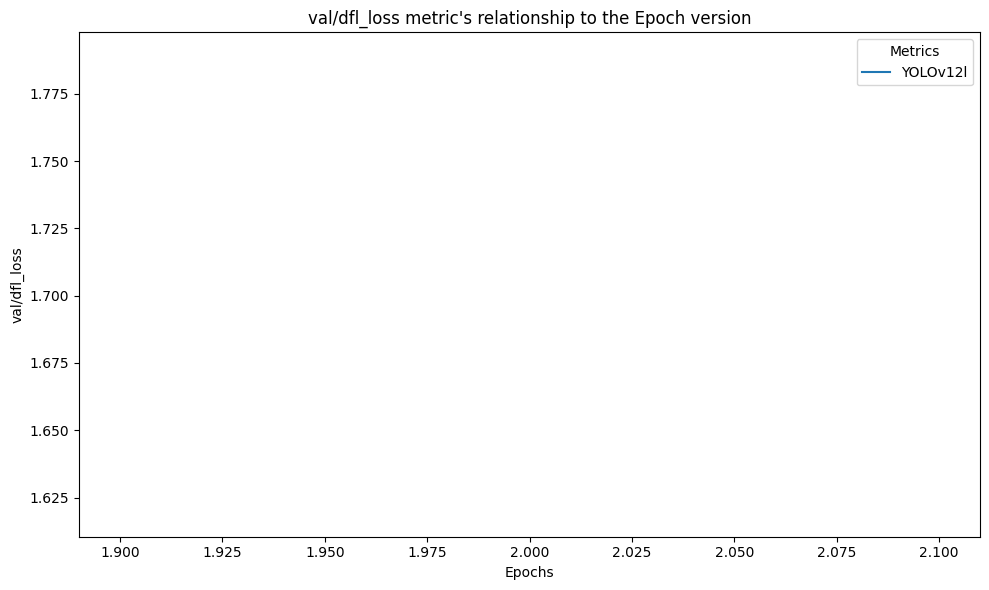

In [27]:
import pandas as pd
import seaborn as sns 

df = pd.read_csv('/kaggle/working/runs/detect/yolo12l.pt/results.csv')

metrics = ['train/box_loss','train/cls_loss','train/dfl_loss','val/box_loss','val/cls_loss','val/dfl_loss']

plt.figure(figsize=(10, 6))

for metric in metrics:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='epoch', y=metric, data=df, label="YOLOv12l")
    
    plt.title(f"{metric} metric's relationship to the Epoch version")
    plt.xlabel("Epochs")
    plt.ylabel(f"{metric}")
    plt.legend(title="Metrics")
    plt.tight_layout()
    
    plt.show()



In [31]:
from imutils import paths

log_dir = "/kaggle/working/runs/detect/yolov12_m2"
for image_path in sorted(paths.list_images(log_dir)):
    image = Image.open(image_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()

In [30]:
paths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/val'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)
print(len(paths2))
print(paths2[0:3])

12
['/kaggle/working/runs/detect/val/BoxF1_curve.png', '/kaggle/working/runs/detect/val/BoxPR_curve.png', '/kaggle/working/runs/detect/val/BoxP_curve.png']


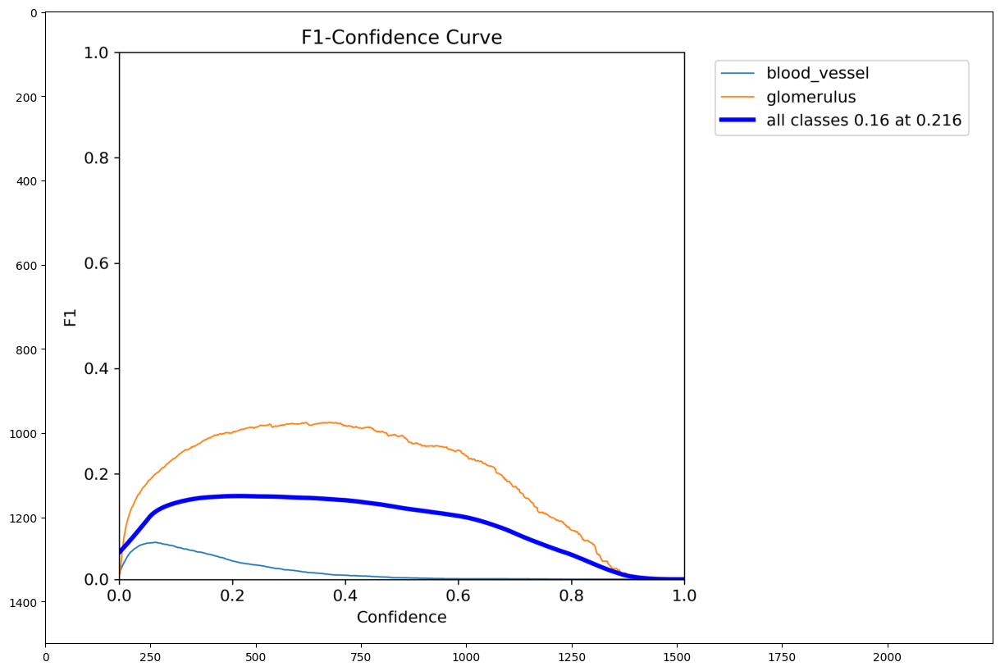

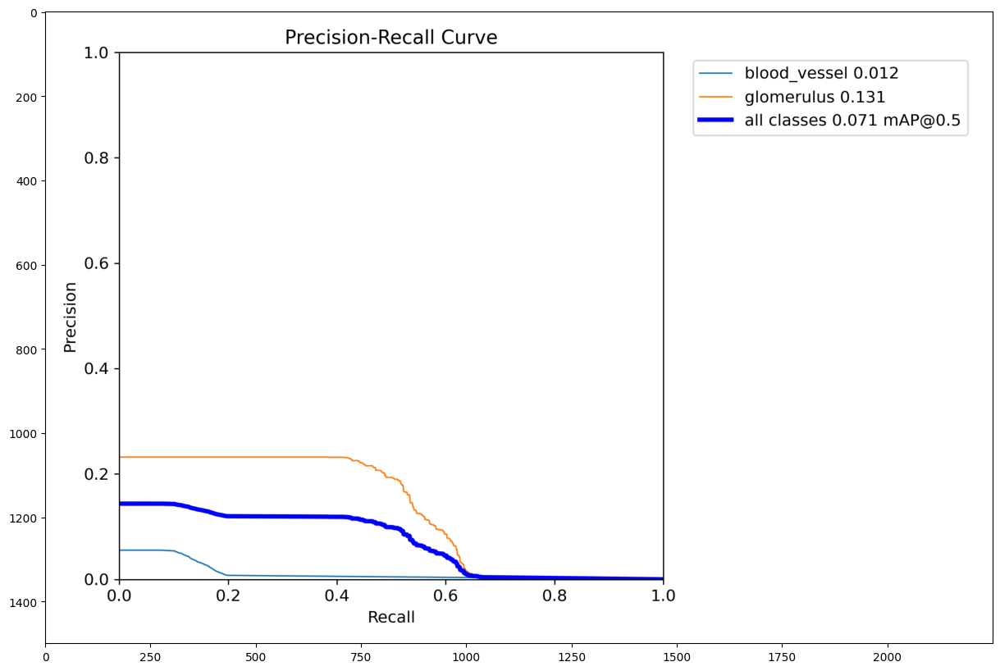

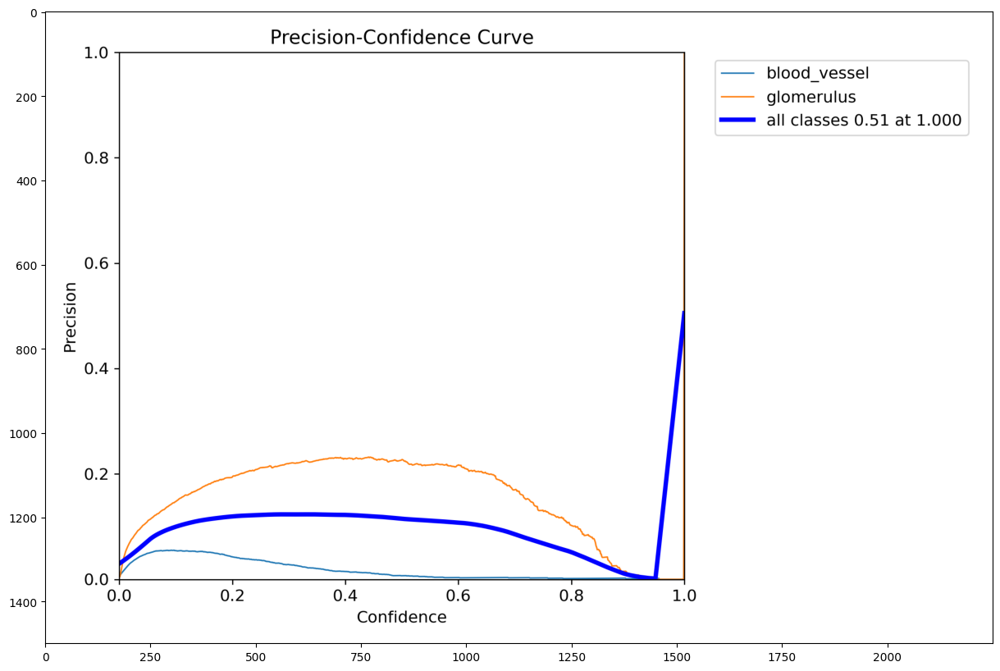

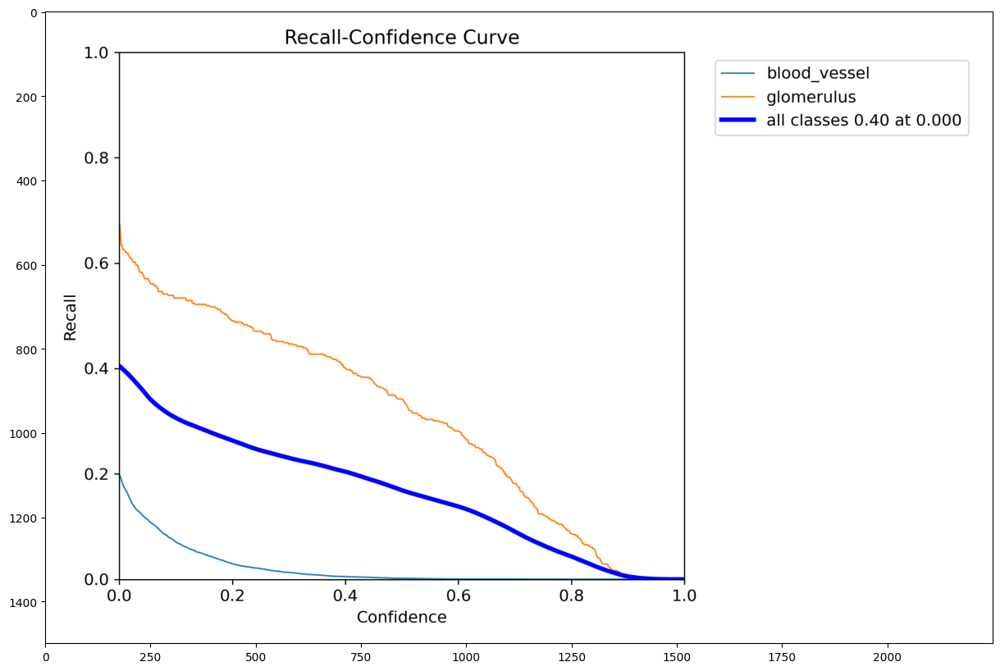

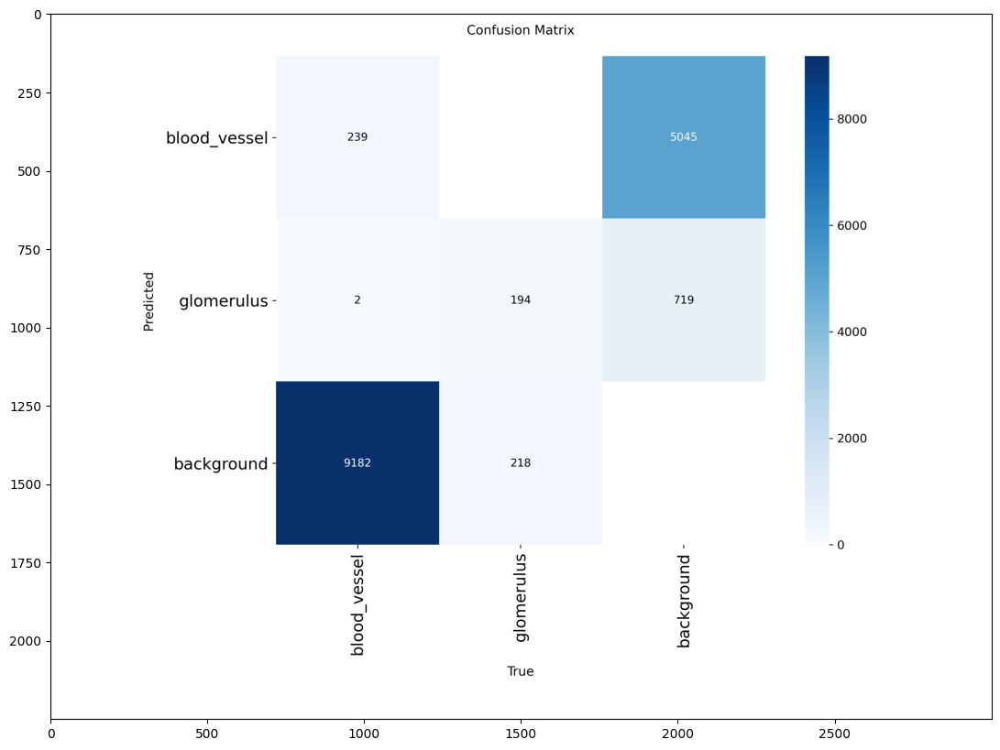

...

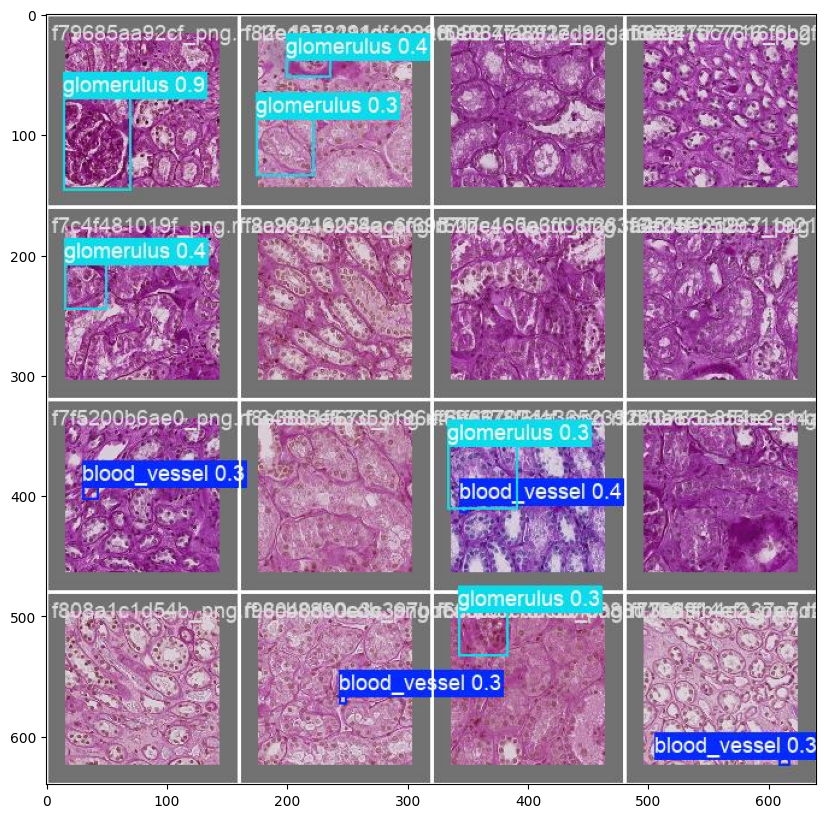

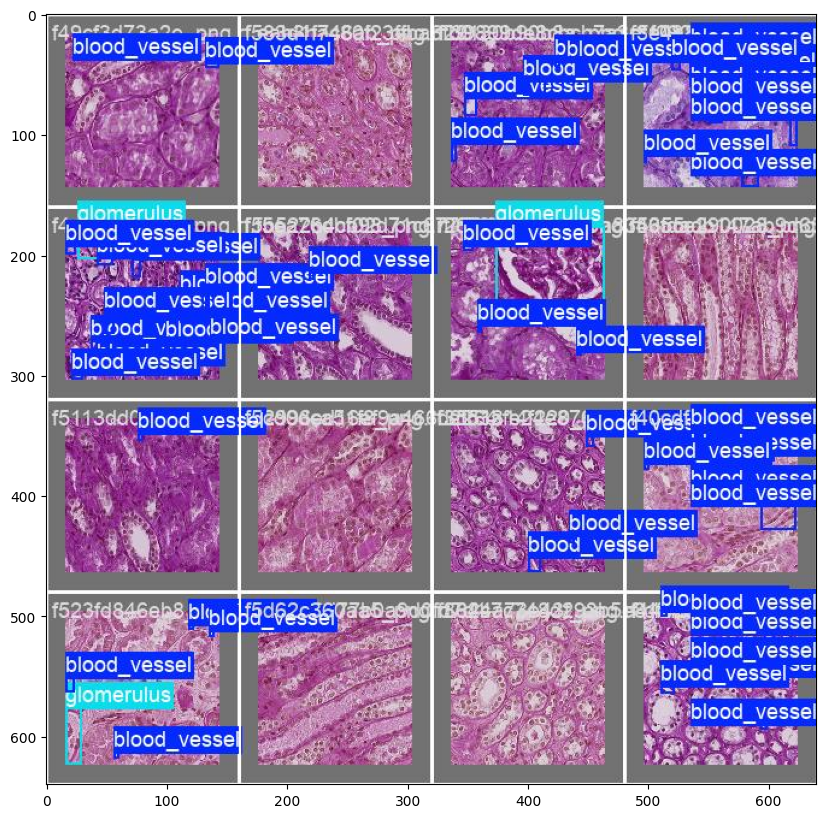

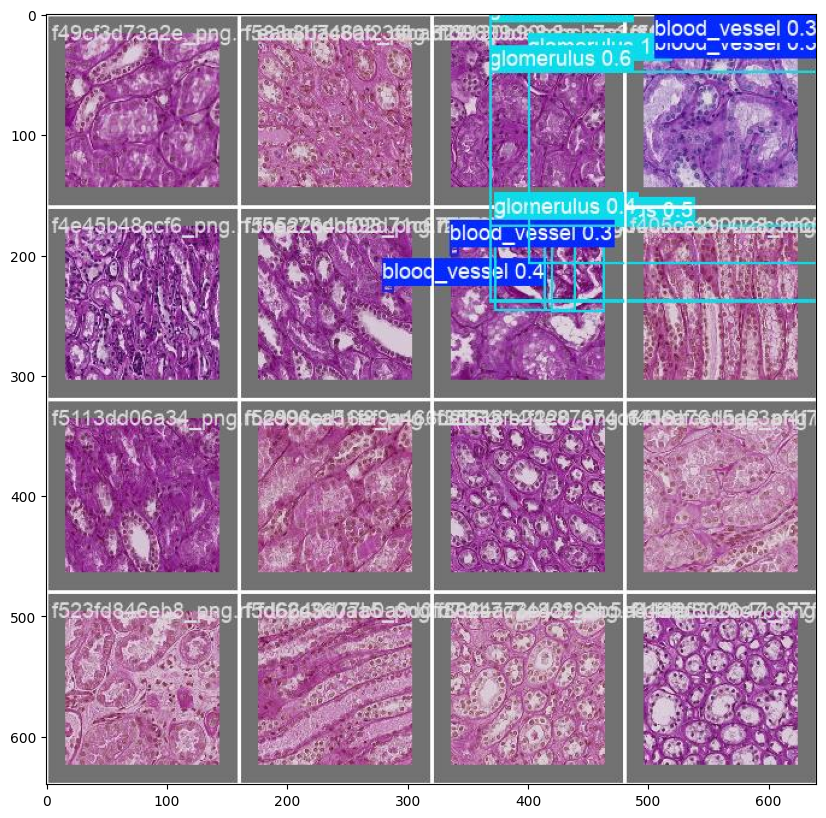

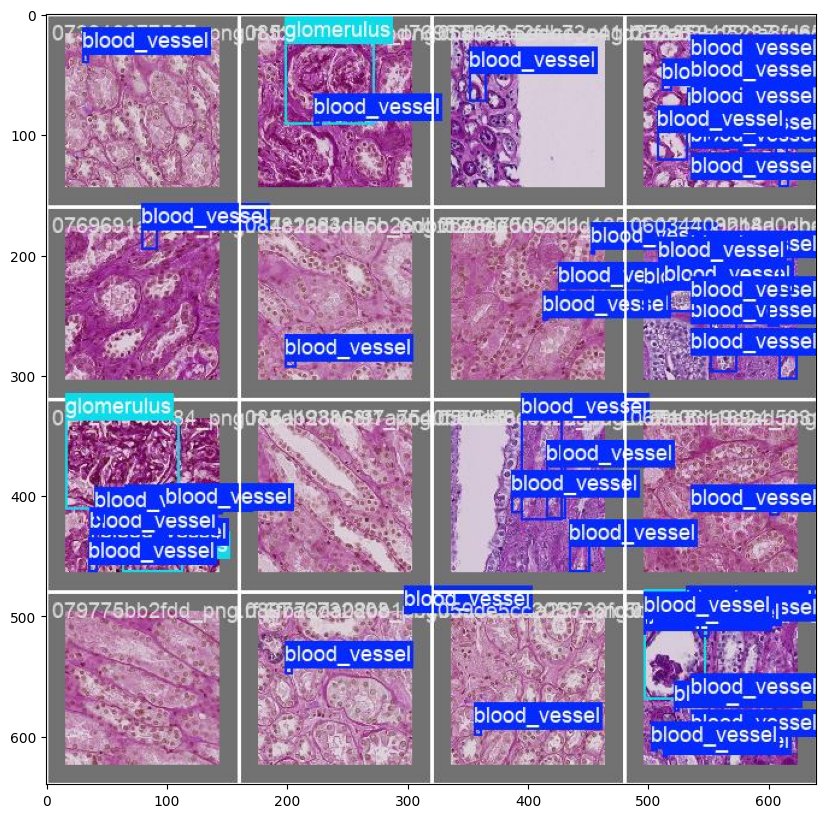

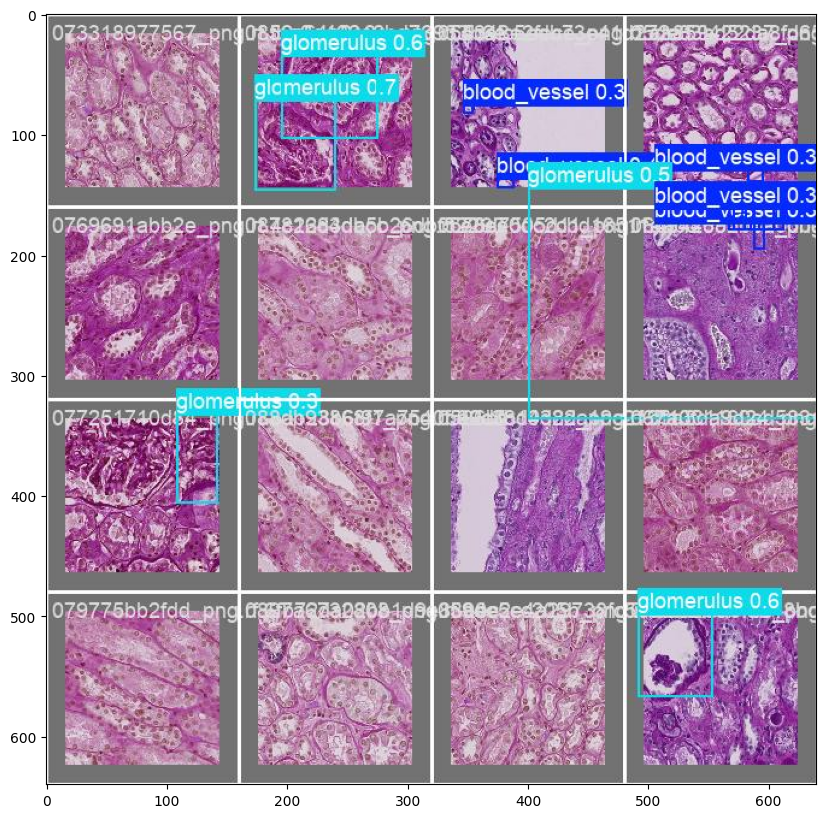

In [32]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()